In [2]:
import json
import os
from PIL import Image
import matplotlib.pyplot as plt

def visualize(image_dir, image_id, text, pred, label, text_label_dict, image_label_dict):
    print("Image ID: ", image_id)
    print("Text: ", text)
    print("Prediction: ", pred)
    print("Label: ", label)
    # print(text_label_dict)
    # import pdb; pdb.set_trace()
    try:
        print("Text Label Dict: ", text_label_dict[image_id])
        if text_label_dict[image_id]['yes'] > text_label_dict[image_id]['no']:
            print("Text Predict: 1")
        else:
            print("Text Predict: 0")
    except KeyError:
        print("No label for this text")
    try:
        print("Image Label Dict: ", image_label_dict[image_id])
        if image_label_dict[image_id][0] > image_label_dict[image_id][1]:
            print("Image Predict: 1")
        else:
            print("Image Predict: 0")
    except KeyError:
        print("No label for this image")
    image_path = os.path.join(image_dir, f"{image_id}.jpg")
        
    # Display the image
    img = Image.open(image_path)
    plt.clf()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    return

In [3]:
import json
import ast

text_label_dict = {}
vision_label_dict = {}

with open("intermediate_data/sarc_text_label_logits.txt", 'r') as f:
    reader = f.readlines()
    for line in reader:
        identifier, json_str = line.split(' ', 1)
        data = json.loads(json_str)
        text_label_dict[identifier] = {'yes': -float('inf'), 'no': -float('inf')}
        if 'Yes' in data.keys():
            text_label_dict[identifier]['yes'] = data['Yes']
        if 'No' in data.keys():
            text_label_dict[identifier]['no'] = data['No']
        # if 'Yes' in data.keys() and 'No' in data.keys():
        #     text_label_dict[identifier] = {'yes': data['Yes'], 'no': data['No']}

with open("intermediate_data/sarc_vision_label_logits.txt", 'r') as f:
    reader = f.readlines()
    for line in reader:
        identifier, list_str = line.split(' ', 1)
        identifier = identifier.split('.')[0]
        data = ast.literal_eval(list_str)
        vision_label_dict[identifier] = data

print(len(text_label_dict))
print(list(text_label_dict.keys())[:5])
print(len(vision_label_dict))
print(list(vision_label_dict.keys())[:5])

22226
['840006160660983809', '908913372199915520', '916496521406726145', '916364004129304576', '853866052589154304']
24635
['682716753374351360', '682721949072625664', '682722242111774720', '682727470433308672', '682751920956641280']


In [4]:
import random
import json

with open("results/sarc_vision_text_label.jsonl", 'r') as f:
    lines = f.readlines()
random.shuffle(lines)

In [7]:
R = {'tot_num': 0, 'correct_num': 0, 'wrong_num': 0}
AS = {'tot_num': 0, 'correct_num': 0, 'wrong_num': 0}
U = {'tot_num': 0, 'correct_num': 0, 'wrong_num': 0}
DS = {'tot_num': 0, 'correct_num': 0, 'wrong_num': 0}

# calculate correct ratio
for line in lines:
    data = json.loads(line)
    image_id = data['image_id']
    if text_label_dict[image_id]['yes'] > text_label_dict[image_id]['no']:
        text_label = 1
    else:
        text_label = 0

    if image_label_dict[image_id][0] > image_label_dict[image_id][1]:
            image_label = 1
        else:
            image_label = 0
    
    gth_label = data['target']
    albef_pred = data['pred']

    if image_label == text_label and image_label == gth_label:
        R['tot_num'] += 1
        if albef_pred == gth_label:
            R['correct_num'] += 1
        else:
            R['wrong_num'] += 1

    if image_label == text_label and image_label != gth_label:
        AS['tot_num'] += 1
        if albef_pred == gth_label:
            AS['correct_num'] += 1
        else:
            AS['wrong_num'] += 1

    if image_label != text_label:
        U['tot_num'] += 1
        if albef_pred == gth_label:
            U['correct_num'] += 1
        else:
            U['wrong_num'] += 1

print(R)
print(AS)
print(U)

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 17)

Image ID:  822955864067710977
Text:  a trio of famous funnycars from legendary dragracer don the snake prudhomme just crossed the block donprudhomme snakeracing
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -13.375556, 'no': -0.0005562512}
Text Predict: 0
Image Label Dict:  [18.5, 18.25]
Image Predict: 1


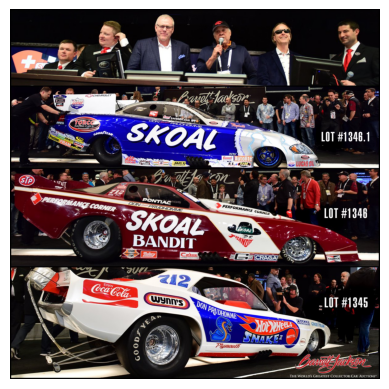

Image ID:  823310605570412544
Text:  would have been first in silver <user>
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -4.4577894, 'no': -0.020289488}
Text Predict: 0
Image Label Dict:  [18.0, 17.25]
Image Predict: 1


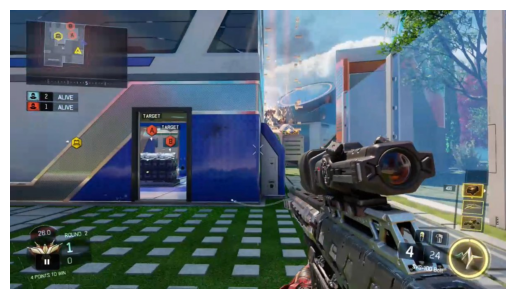

Image ID:  834100440988020736
Text:  my black workout partner drinks water fml
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.9168417, 'no': -0.5105917}
Text Predict: 0
Image Label Dict:  [15.125, 15.3125]
Image Predict: 1


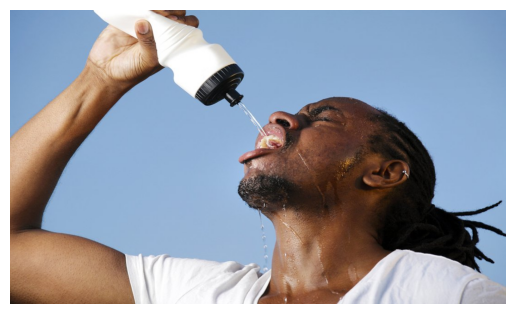

Image ID:  881812123910897664
Text:  be the envy of your friends our first two followers to come to reprographics will get this amazing mv16 goody bag mv16induction
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.74117804, 'no': -0.64742804}
Text Predict: 0
Image Label Dict:  [17.25, 17.25]
Image Predict: 1


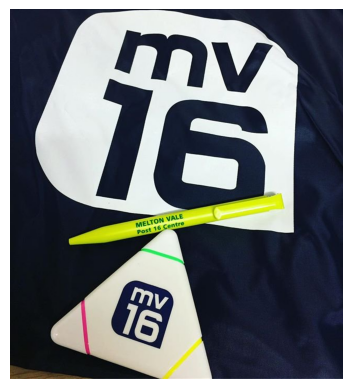

Image ID:  884686920919519233
Text:  the man on the mic goodwood fos 2017 drywit attentionpaddock shouldibeaskedback
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.11289812, 'no': -2.237898}
Text Predict: 1
Image Label Dict:  [15.875, 15.5625]
Image Predict: 1


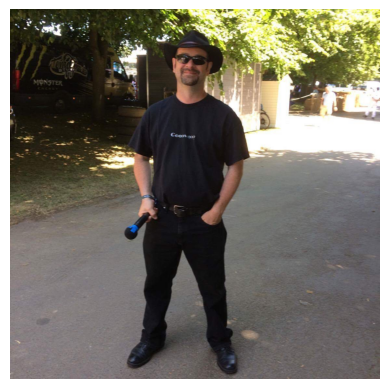

Image ID:  931592093411299328
Text:  seems appropriate
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -1.8603038, 'no': -0.76655376}
Text Predict: 0
Image Label Dict:  [16.5, 15.875]
Image Predict: 1


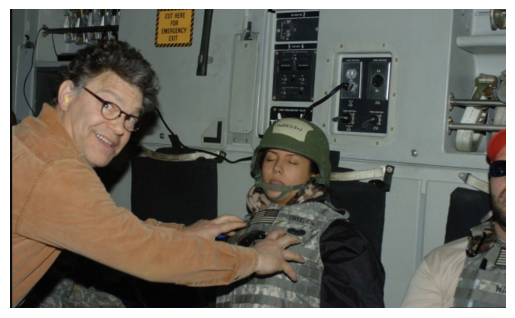

Image ID:  859427673516503042
Text:  yeah this
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.23199694, 'no': -1.5757469}
Text Predict: 1
Image Label Dict:  [20.0, 18.375]
Image Predict: 1


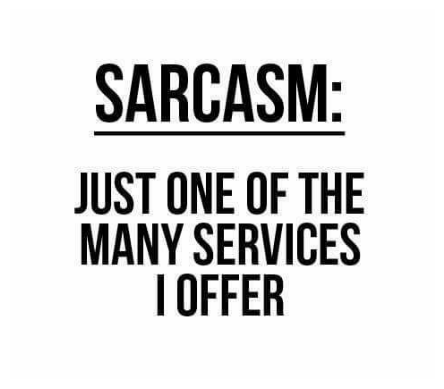

Image ID:  830073554435719168
Text:  isn t it cute marching and shouting death to america earlier today how dare the president ban these people smh
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.00011164904, 'no': -9.218862}
Text Predict: 1
Image Label Dict:  [16.75, 16.375]
Image Predict: 1


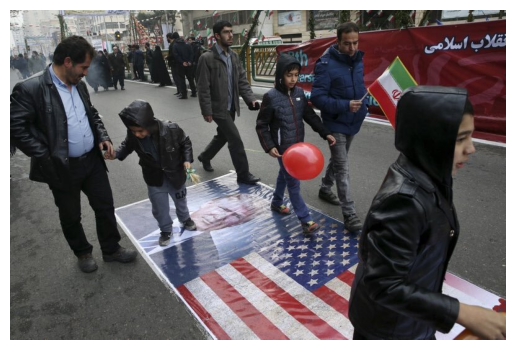

Image ID:  891786666515542016
Text:  never mind us he s just a que and i m just a rapper allunity
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.025532365, 'no': -3.6817822}
Text Predict: 1
Image Label Dict:  [15.625, 15.875]
Image Predict: 1


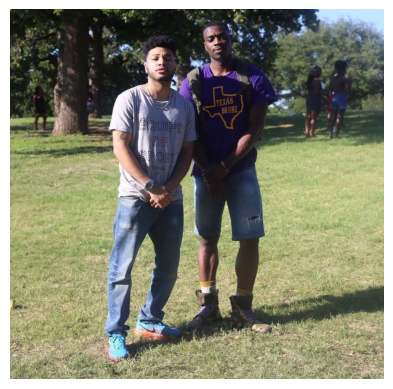

Image ID:  850076717360263168
Text:  chapter 17 love getting kicked out of bars soannoying
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.000104377614, 'no': -9.484479}
Text Predict: 1
Image Label Dict:  [16.625, 16.375]
Image Predict: 1


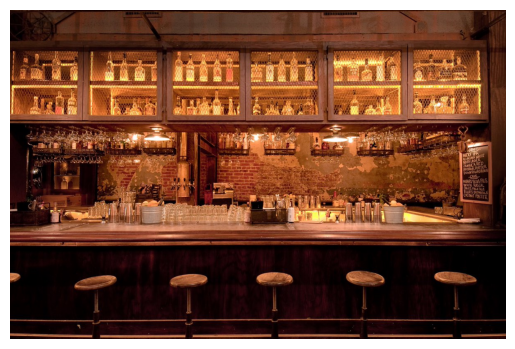

Image ID:  868195630073729025
Text:  $ shld is now hiring the future looks bright
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.007643902, 'no': -4.8826437}
Text Predict: 1
Image Label Dict:  [18.5, 17.875]
Image Predict: 1


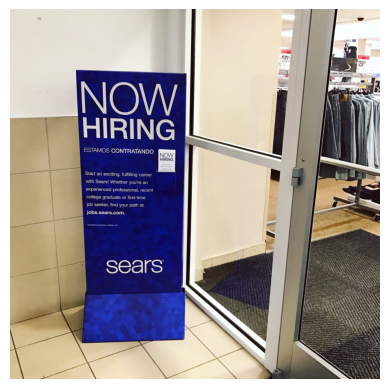

Image ID:  932636894277627905
Text:  sunsets are def not my thing homohoes
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.02817682, 'no': -3.5906768}
Text Predict: 1
Image Label Dict:  [15.9375, 16.625]
Image Predict: 1


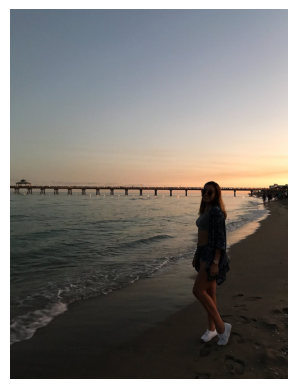

Image ID:  881332956270215168
Text:  it s real love romance emoji_1984 emoji_297 emoji_1629
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -6.8005543, 'no': -0.0036790518}
Text Predict: 0
Image Label Dict:  [20.375, 19.25]
Image Predict: 1


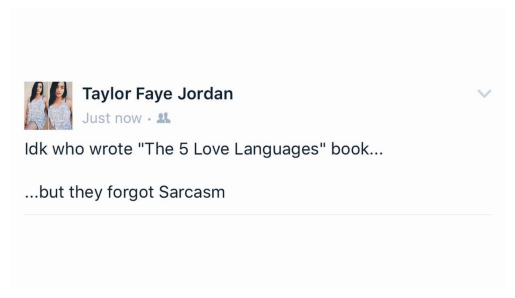

Image ID:  817520655868588033
Text:  i gotta write this e mail too early smfh
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -2.3504782, 'no': -0.10047818}
Text Predict: 0
Image Label Dict:  [19.75, 19.5]
Image Predict: 1


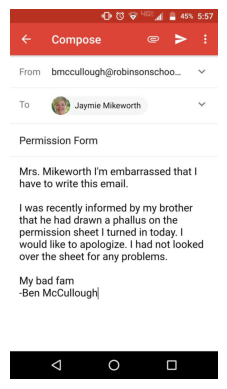

Image ID:  820417483010150401
Text:  why elmo why elmoments
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -1.7530787, 'no': -0.19057874}
Text Predict: 0
Image Label Dict:  [16.125, 16.0]
Image Predict: 1


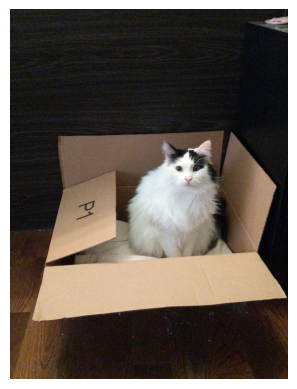

Image ID:  895654888931115009
Text:  trekked to the big buddha today chose the bestday wasnt foggy at all
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.0011909412, 'no': -6.751191}
Text Predict: 1
Image Label Dict:  [14.6875, 15.0625]
Image Predict: 1


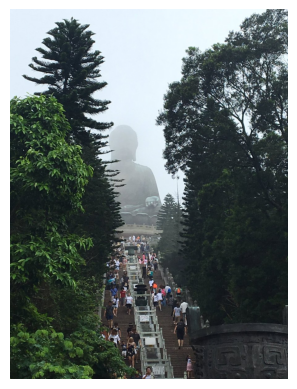

Image ID:  819329628569477120
Text:  most rewarding part of being a med student is helping your friends in times of need
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -9.421988, 'no': -0.00011236426}
Text Predict: 0
Image Label Dict:  [20.0, 18.875]
Image Predict: 1


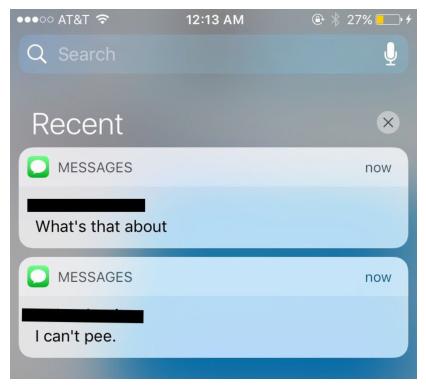

Image ID:  896395869532160000
Text:  me n pops rockin some of our <user> cult garb to my cousins second bday party in li hope we don t mess him up too much lol
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.03580195, 'no': -3.348302}
Text Predict: 1
Image Label Dict:  [15.625, 14.75]
Image Predict: 1


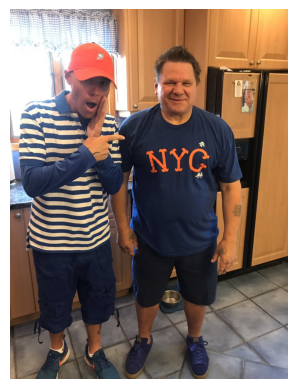

Image ID:  822947470862848000
Text:  sometimes the questions are complicated and the answers are simple » dr seuss drseuss supersoulsunday
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -6.501546, 'no': -0.001546049}
Text Predict: 0
Image Label Dict:  [18.75, 19.375]
Image Predict: 1


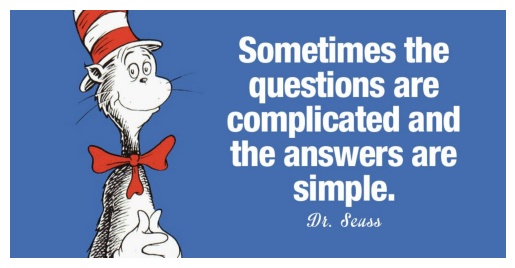

Image ID:  922515405628985344
Text:  liberallogic why she hangin wit da kkk maga
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.22004919, 'no': -1.6419241}
Text Predict: 1
Image Label Dict:  [15.8125, 15.625]
Image Predict: 1


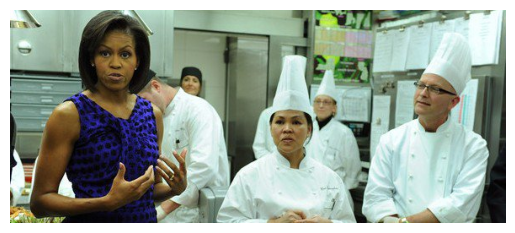

Image ID:  823314785697726464
Text:  game time patriotsnation nevspit doyourjob onemore patriots
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -12.078934, 'no': -0.00080867147}
Text Predict: 0
Image Label Dict:  [18.625, 19.0]
Image Predict: 1


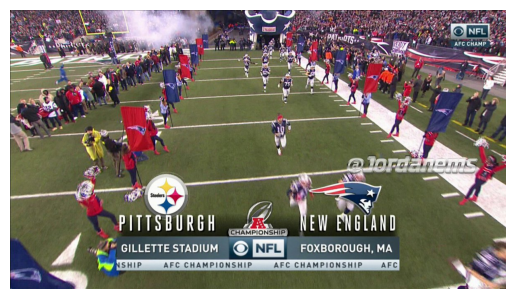

Image ID:  846664012330811393
Text:  judgement is up to the dog
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -2.3505166, 'no': -0.10051645}
Text Predict: 0
Image Label Dict:  [18.75, 18.25]
Image Predict: 1


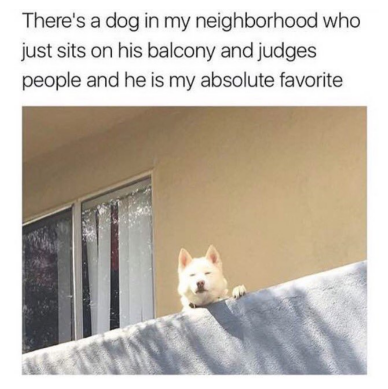

Image ID:  830070414130962432
Text:  i c o n i c yesterdaywasthursday wesoexcited funfunfunfun emoji_15
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.0061835526, 'no': -5.0999336}
Text Predict: 1
Image Label Dict:  [19.625, 19.125]
Image Predict: 1


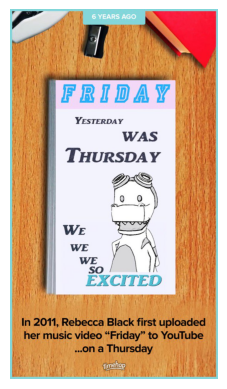

Image ID:  823310569612525569
Text:  an ugly beautiful story would recommend
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.2072943, 'no': -1.6760443}
Text Predict: 1
Image Label Dict:  [19.25, 18.875]
Image Predict: 1


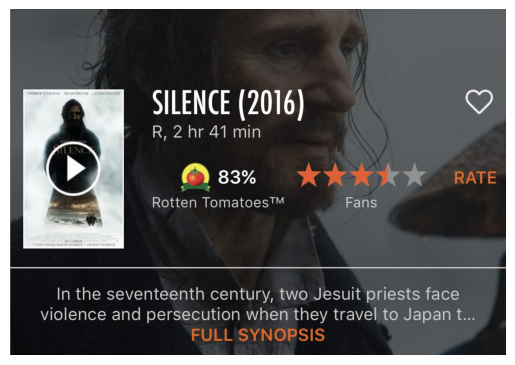

Image ID:  819543361912770560
Text:  the hearing for ben carson starts today for his vision for the future of hud just look at his great logic and reasoning
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.0013803522, 'no': -6.5951304}
Text Predict: 1
Image Label Dict:  [19.875, 18.875]
Image Predict: 1


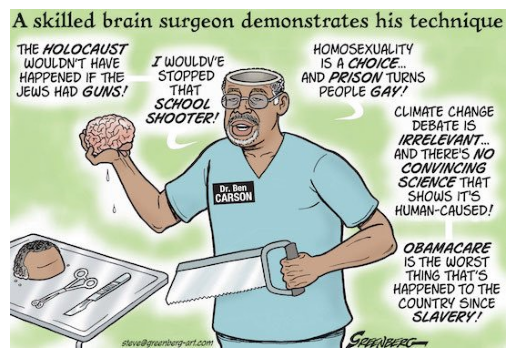

Image ID:  885404127764692992
Text:  yep pure happiness and joy for sure so who offers lol funny naughty
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.00010640408, 'no': -9.484482}
Text Predict: 1
Image Label Dict:  [18.875, 18.875]
Image Predict: 1


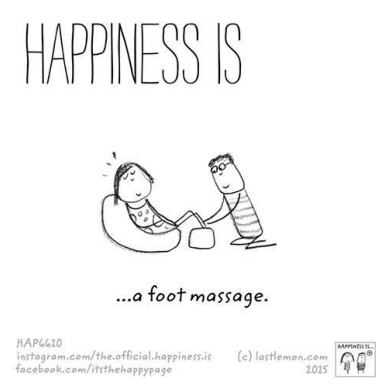

Image ID:  853510279476506625
Text:  is it true humility pompous question
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.2665867, 'no': -1.4540867}
Text Predict: 1
Image Label Dict:  [17.625, 17.125]
Image Predict: 1


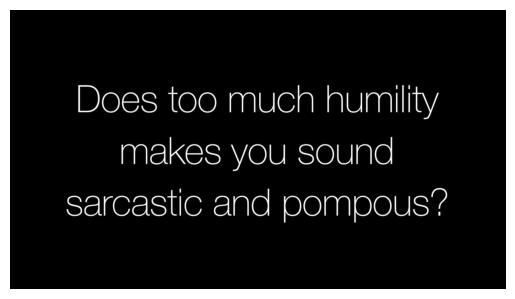

Image ID:  822222796881326080
Text:  yo if you didn ’ t want advent to find your rebel encampment maybe you should have named it something else
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.014626469, 'no': -4.2333765}
Text Predict: 1
Image Label Dict:  [19.0, 18.375]
Image Predict: 1


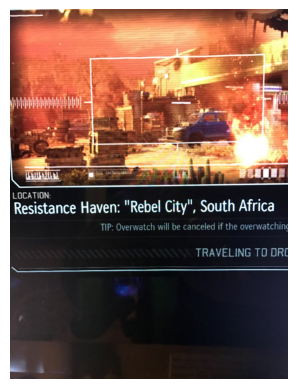

Image ID:  708410201246982144
Text:  refusing to kowtow to the pc police is much more offensive than dumping urine on someone thetriggering
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.0017508649, 'no': -6.361126}
Text Predict: 1
Image Label Dict:  [18.0, 17.5]
Image Predict: 1


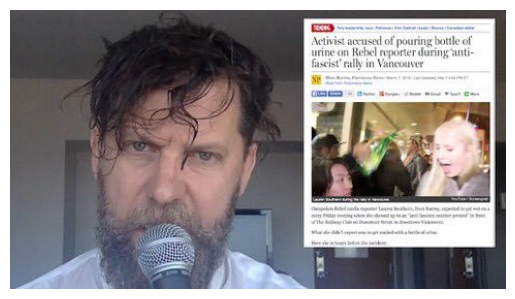

Image ID:  823316287233216512
Text:  yum yum <user>
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -6.2430663, 'no': -0.00869115}
Text Predict: 0
Image Label Dict:  [17.125, 17.625]
Image Predict: 1


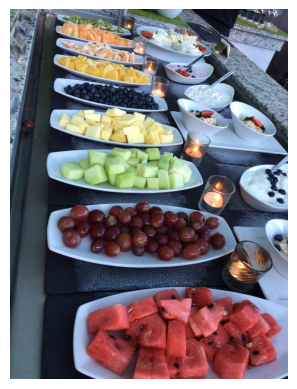

Image ID:  857712748771155968
Text:  just a little difference before the <num> o clock hour today compared to this time yesterday <user>
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -2.426208, 'no': -0.87933296}
Text Predict: 0
Image Label Dict:  [19.875, 19.75]
Image Predict: 1


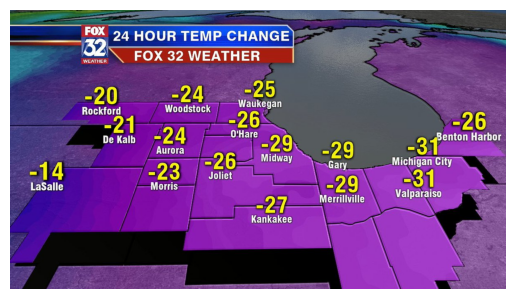

Image ID:  720846584955600898
Text:  shocking img of an aggressive us navy ship cruising dangerously close to a russian su24 jet balticsea
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -1.2236389, 'no': -0.34863892}
Text Predict: 0
Image Label Dict:  [15.0625, 14.625]
Image Predict: 1


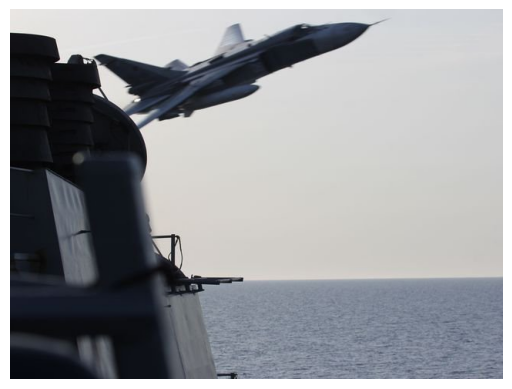

Image ID:  823319286374682625
Text:  buffalo just know i got us
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -5.800094, 'no': -0.0032193032}
Text Predict: 0
Image Label Dict:  [17.25, 17.75]
Image Predict: 1


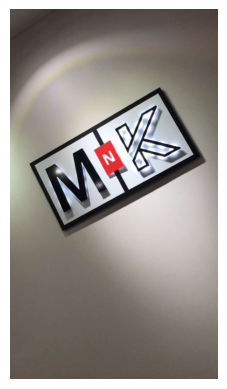

Image ID:  822947281955590151
Text:  where s my scepter where s my crown why am i not on a throne inauguration
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -2.4749568e-05, 'no': -11.20315}
Text Predict: 1
Image Label Dict:  [15.625, 15.0625]
Image Predict: 1


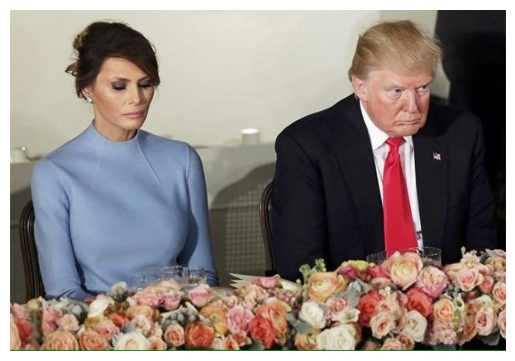

Image ID:  822223071469768704
Text:  and the first person to do the glitch to me goes to this guy
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -4.4031825, 'no': -0.012557562}
Text Predict: 0
Image Label Dict:  [19.125, 18.875]
Image Predict: 1


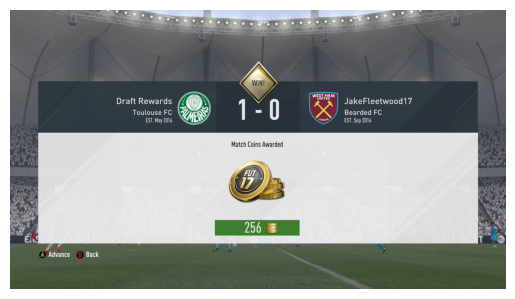

Image ID:  820054532226973696
Text:  we back you bani & i stand by bani trending simultaneously in india i mean how fantastic can this get
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.011779592, 'no': -4.44928}
Text Predict: 1
Image Label Dict:  [20.25, 20.0]
Image Predict: 1


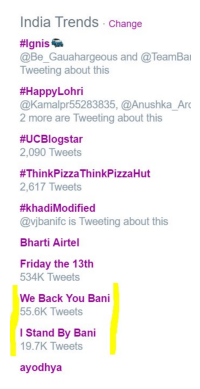

Image ID:  794277155811233792
Text:  i will emoji_236 emoji_236 emoji_236
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -7.3306046, 'no': -0.0024794622}
Text Predict: 0
Image Label Dict:  [19.875, 19.125]
Image Predict: 1


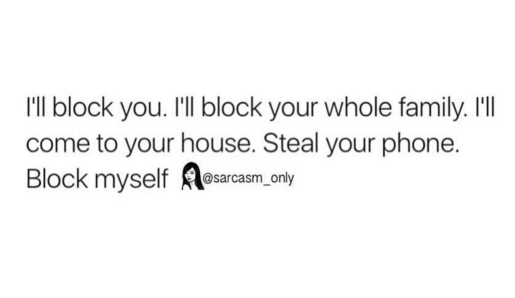

Image ID:  867089567492575233
Text:  <user> your wordpress so enlightening such glorious gems of loving christianity surely jesus smiles down on you
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -2.9875326e-05, 'no': -11.06253}
Text Predict: 1
Image Label Dict:  [20.125, 19.375]
Image Predict: 1


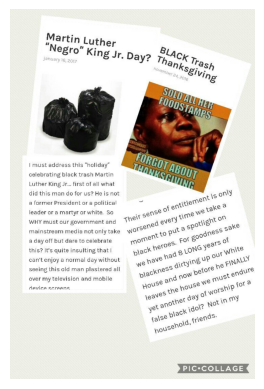

Image ID:  844260291332530181
Text:  isro makes history given side step vksasikala in jail gets salute star theghantas deservesaghanta …
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -3.9769227e-05, 'no': -10.421915}
Text Predict: 1
Image Label Dict:  [16.375, 16.625]
Image Predict: 1


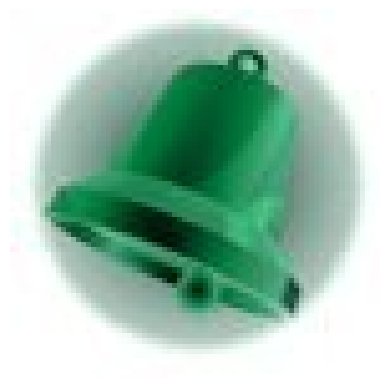

Image ID:  817517299494166529
Text:  haha woah dude ever heard of knocking
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.076585114, 'no': -2.607835}
Text Predict: 1
Image Label Dict:  [15.4375, 15.125]
Image Predict: 1


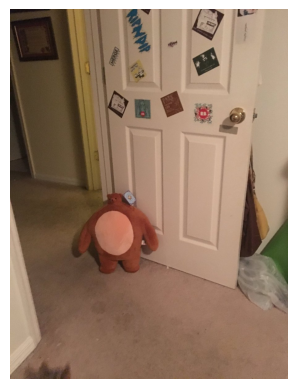

Image ID:  870540421474074628
Text:  again really roughing it out here wish there was a better view
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.0010690123, 'no': -6.860444}
Text Predict: 1
Image Label Dict:  [17.25, 17.25]
Image Predict: 1


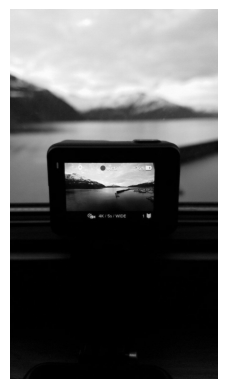

Image ID:  819331236585938944
Text:  at a restaurant in nyc <user> orders a water then this comes out and we notice the menu lmao
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.66322625, 'no': -0.72572625}
Text Predict: 1
Image Label Dict:  [15.5, 14.875]
Image Predict: 1


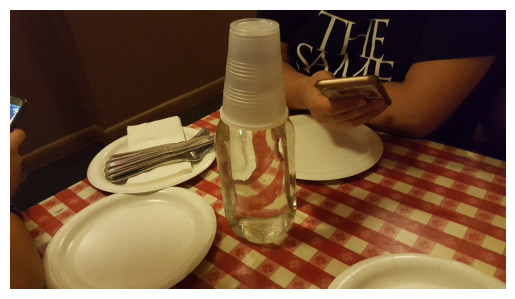

Image ID:  870279249734664192
Text:  iwishihadmore people in my life that add ly to all their adverbs & adjectives & began their sentences with the word so emoji_3851
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.0024894532, 'no': -6.0024896}
Text Predict: 1
Image Label Dict:  [17.0, 16.25]
Image Predict: 1


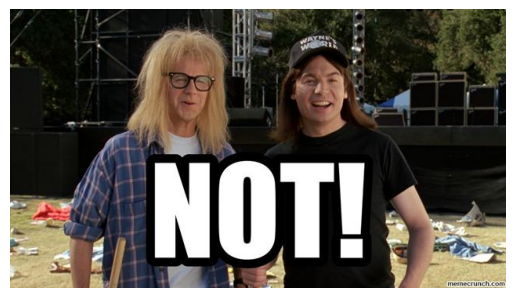

Image ID:  907834540005175297
Text:  <user> how dare you ableism jk deaf emoji_1351 emoji_1351 emoji_1351 emoji_1351 emoji_1351
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -0.07208711, 'no': -2.665837}
Text Predict: 1
Image Label Dict:  [19.75, 19.875]
Image Predict: 1


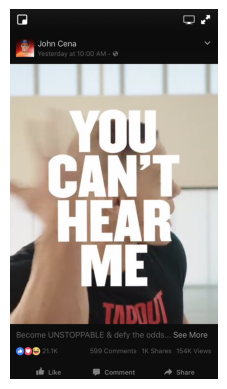

Image ID:  822229864149184512
Text:  omg now i know where i recognize kim from hatchetface crybaby cbb
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.025546659, 'no': -3.6817966}
Text Predict: 1
Image Label Dict:  [15.125, 13.9375]
Image Predict: 1


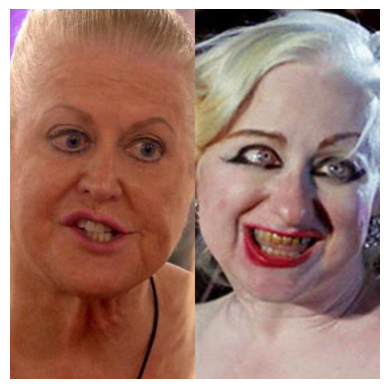

Image ID:  818239973837049856
Text:  not sorry just misunderstood spends a lot of time speaking read patronising to patients no we don t want u back
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.0007056409, 'no': -7.2819557}
Text Predict: 1
Image Label Dict:  [17.625, 17.25]
Image Predict: 1


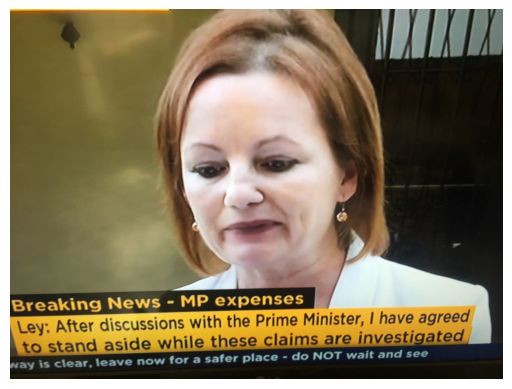

Image ID:  882967300407742466
Text:  lazing on the beach got sand on my feet iblamebrexit brexitblamedforeverything
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -0.000108907356, 'no': -9.343859}
Text Predict: 1
Image Label Dict:  [15.1875, 15.1875]
Image Predict: 1


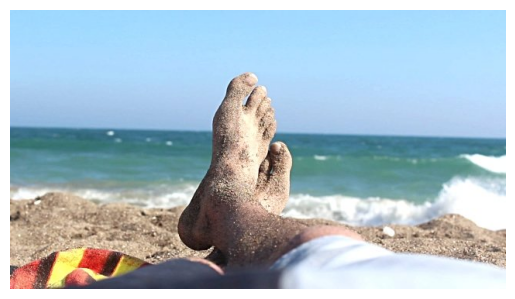

Image ID:  694514328603459585
Text:  the freaking king
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -3.6942189, 'no': -0.5535938}
Text Predict: 0
Image Label Dict:  [18.75, 17.875]
Image Predict: 1


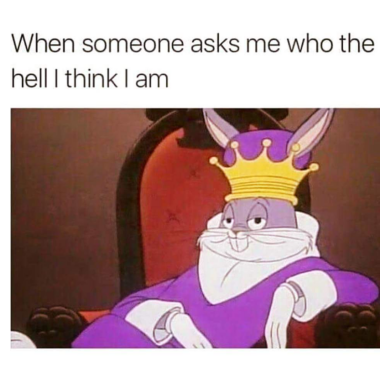

Image ID:  819692440592482307
Text:  when the obamas leave the white house
Prediction:  0
Label:  1
Text Label Dict:  {'yes': -5.4575605, 'no': -0.0044356976}
Text Predict: 0
Image Label Dict:  [19.5, 18.375]
Image Predict: 1


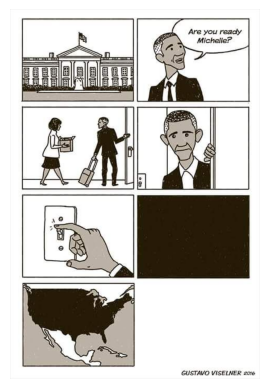

Image ID:  819327316404957185
Text:  when all of your friends live in missouri
Prediction:  1
Label:  0
Text Label Dict:  {'yes': -5.8675947, 'no': -0.16446988}
Text Predict: 0
Image Label Dict:  [19.625, 19.375]
Image Predict: 1


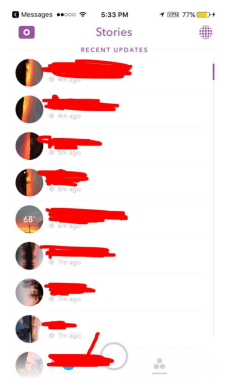

In [5]:
# visualize the first 5 examples
count = 0
for line in lines:
    data = json.loads(line)
    if data["pred"] != data["target"]:
        visualize(
            "raw_data/image_data", 
            data["image_id"], 
            data["text"], 
            data["pred"], 
            data["target"], 
            text_label_dict, 
            vision_label_dict
        )
        count += 1
        if count == 50:
            break